In [119]:
from importlib import reload
from functools import partial
import math

import IPython.display as ipd
import librosa as lr
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats

import utilty

%config InlineBackend.figure_format = 'svg'
plt.rcParams['figure.figsize'] = (8, 3)
ipd.display(ipd.HTML("<style>.container { width:100% !important; }</style>"))

Load all 30 second segments of track.

In [3]:
track = utilty.get_audio_tracks()[0]
track = utilty.find_file('scar')

sec = 30
duration = utilty.get_duration(track)
segments = int(duration) // sec
audio_30secs = [lr.load(track, offset=sec*i, duration=sec) 
                for i in range(segments)]

In [4]:
audio, sr = audio_30secs[-1]
ipd.Audio(data=audio, rate=sr)

In [208]:
# spectrograms_30secs = [utilty.get_spectrograms(audio)
#                        for audio, _ in audio_30secs]

# Chroma

In [237]:
chroma_sync_30_secs = np.array([utilty.beat_synchronous_chroma_enhanced(audio) 
                                for audio, _ in audio_30secs])

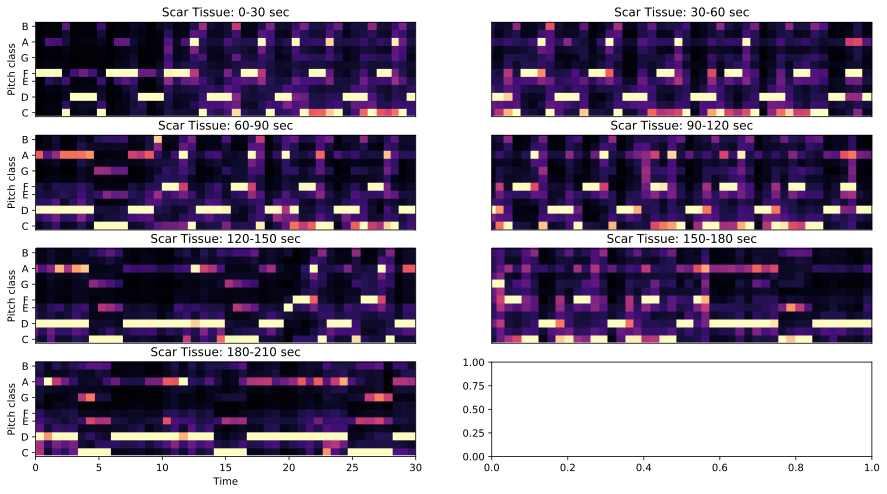

In [238]:
cols = 2
size = math.ceil(segments / cols)
fig, axes = plt.subplots(size, cols, figsize=(15, size*2))
name = track.stem.split('-')[-1].replace('_', ' ').title()

for i, ((c_sync, beat_t), axis) in enumerate(zip(chroma_sync_30_secs, axes.ravel())):
    specshow = partial(lr.display.specshow, c_sync, x_coords=beat_t, ax=axis)
    
    if axis.is_first_col() and axis.is_last_row():
        specshow(x_axis='time', y_axis='chroma')
    elif axis.is_first_col():
        specshow(y_axis='chroma')
    elif axis.is_last_row():
        specshow(x_axis='time')
    else:
        specshow()
    
    axis.set_title(f'{name}: {30*i}-{30*(i+1)} sec')

__TODO (Chroma):__ use a single pitch to determine which index corresponds to each note

In [7]:
chroma_aggs = utilty.get_aggregations(c_sync, axis=1)
chroma_aggs.mean

array([0.50084588, 0.59224963, 0.75192855, 0.51529477, 0.38518453,
       0.31799242, 0.2399669 , 0.26145035, 0.34901436, 0.47103143,
       0.34559222, 0.35446934])

# Tempo

In [42]:
dynamic_tempograms = np.array([utilty.dynamic_tempo_estimation(audio)
                               for audio, _ in audio_30secs])

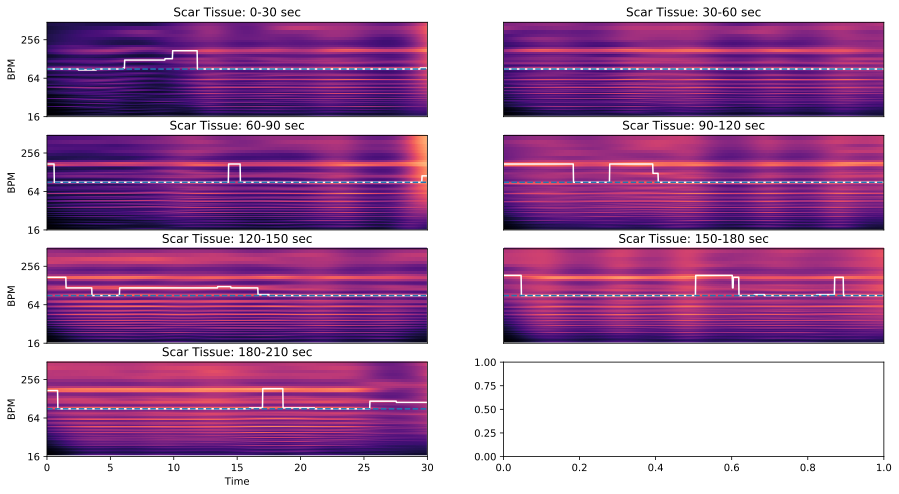

In [43]:
cols = 2
size = math.ceil(segments / cols)
fig, axes = plt.subplots(size, cols, figsize=(15, size*2))
name = track.stem.split('-')[-1].replace('_', ' ').title()

for i, ((tempogram, dyn_tempo, tempo), axis) in enumerate(zip(dynamic_tempograms, axes.ravel())):
    lr.display.specshow(tempogram, x_axis='time', y_axis='tempo', ax=axis)
    
    axis.xaxis.set_visible(False)
    axis.yaxis.set_visible(False)
    
    if axis.is_first_col():
        axis.yaxis.set_visible(True)
    if axis.is_last_row():
        axis.xaxis.set_visible(True)

    times = lr.frames_to_time(np.arange(len(dyn_tempo)))
    axis.plot(times, dyn_tempo, 'w')
    axis.plot(times, [tempo] * len(times), '--')
    
    axis.set_title(f'{name}: {30*i}-{30*(i+1)} sec')

In [47]:
dynamic_tempograms[0].shape

(3,)

In [58]:
tg, dt, t = map(np.array, zip(*dynamic_tempograms))

In [71]:
dyn_tempo.shape

(1292,)

In [72]:
utilty.get_aggregations(dyn_tempo)

Aggregations(mean=100.82133132476604, median=89.10290948275862, mode=ModeResult(mode=array([89.10290948]), count=array([839])), max=184.5703125, min=89.10290948275862, std=25.467027486621305, sum=130261.16007159773)

In [73]:
tempo

array([89.10290948])

In [75]:
tg.shape

(7, 384, 1292)

In [76]:
dt.shape

(7, 1292)

In [77]:
t.shape

(7, 1)

# Harmonic & Percussive Separation

In [79]:
lr.get_duration(audio)

30.0

In [208]:
stft = lr.stft(audio)
harmonic, percussive = lr.decompose.hpss(stft, margin=16)

audio_harm = lr.istft(harmonic)
audio_perc = lr.istft(percussive)

In [203]:
# Get a more isolated percussive component by widening its margin
# audio_harm, audio_perc = librosa.effects.hpss(audio, margin=(1.0,5.0))

In [204]:
# ipd.Audio(lr.effects.harmonic(audio), rate=sr)

In [234]:
ipd.Audio(audio_harm, rate=sr)

In [235]:
ipd.Audio(audio_perc, rate=sr)

In [236]:
ipd.Audio(audio_resi, rate=sr)

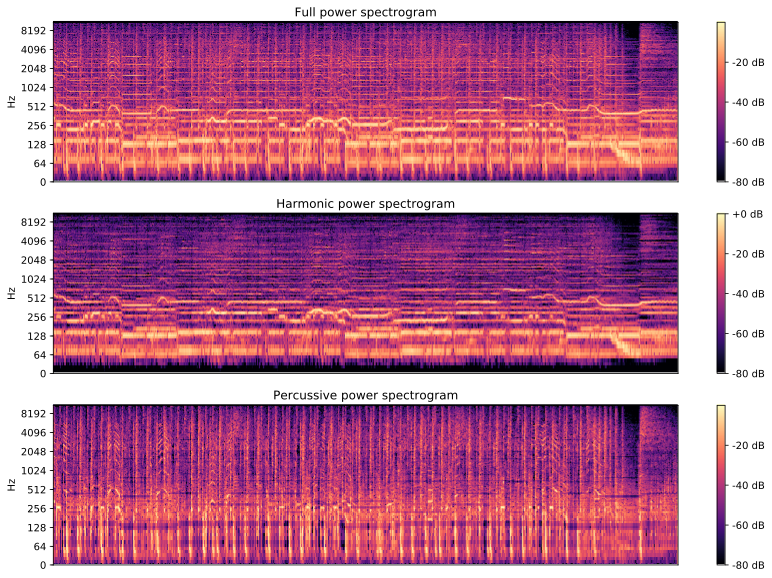

In [112]:
plt.figure(figsize=(14, 10))
plt.subplot(3, 1, 1)
lr.display.specshow(lr.amplitude_to_db(np.abs(stft), ref=np.max), y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Full power spectrogram')

plt.subplot(3, 1, 2)
lr.display.specshow(lr.amplitude_to_db(np.abs(harmonic), ref=np.max), y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Harmonic power spectrogram')

plt.subplot(3, 1, 3)
lr.display.specshow(lr.amplitude_to_db(np.abs(percussive), ref=np.max), y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Percussive power spectrogram');

In [136]:
chroma_sync_harm, beat_time_harm = utilty.beat_synchronous_chroma(audio_harm)
chroma_sync_norm, beat_time_norm = utilty.beat_synchronous_chroma(audio)
chroma_sync_perc, beat_time_perc = utilty.beat_synchronous_chroma(audio_perc)

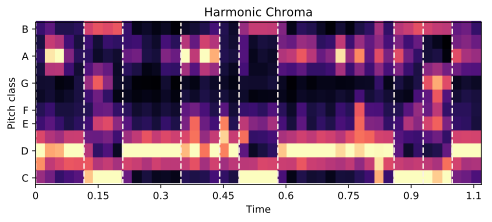

In [176]:
bounds = lr.segment.agglomerative(chroma_sync_harm, 10)
bound_times = lr.frames_to_time(bounds)

lr.display.specshow(chroma_sync_harm, x_axis='time', y_axis='chroma')
plt.title('Harmonic Chroma')
plt.vlines(bound_times, 0, chroma_sync_harm.shape[0], color='linen',
           linestyle='--');
# trouble syncing the bound times with x_coord=beat_time_harm

In [182]:
# get widths of the bounds. maybe do utility.aggregations
bound_widths = np.diff(bounds)
utilty.get_aggregations(bound_widths)

Aggregations(mean=4.777777777777778, median=4.0, mode=ModeResult(mode=array([4]), count=array([3])), max=12, min=2, std=2.779999111821512, sum=43)

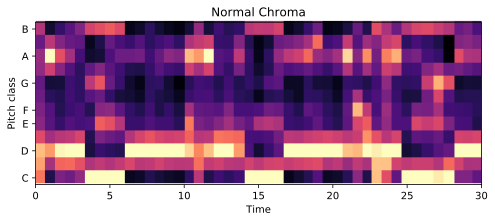

In [142]:
lr.display.specshow(chroma_sync_norm, x_coords=beat_time_norm, x_axis='time', y_axis='chroma')
plt.title('Normal Chroma');

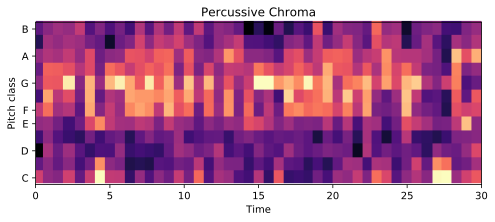

In [140]:
lr.display.specshow(chroma_sync_perc, x_coords=beat_time_perc, x_axis='time', y_axis='chroma')
plt.title('Percussive Chroma');

In [144]:
tg, dyn, tempo = utilty.dynamic_tempo_estimation(audio_perc)

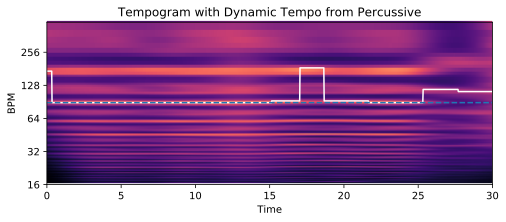

In [148]:
lr.display.specshow(tg, x_axis='time', y_axis='tempo')
times = lr.frames_to_time(np.arange(len(dyn)))
plt.plot(times, dyn, 'w')
plt.plot(times, [tempo] * len(times), '--')
plt.title('Tempogram with Dynamic Tempo from Percussive');

# Vocal & Instrument separation

In [216]:
foreground, background = utilty.vocal_separation(audio)
stft = lr.stft(audio)

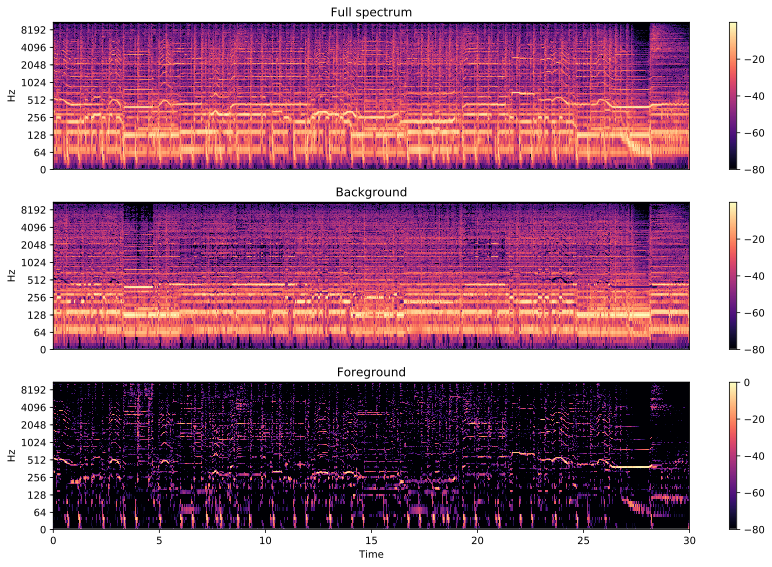

In [217]:
plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
lr.display.specshow(lr.amplitude_to_db(abs(stft), ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(3, 1, 2)
lr.display.specshow(lr.amplitude_to_db(background, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Background')
plt.colorbar()
plt.subplot(3, 1, 3)
lr.display.specshow(lr.amplitude_to_db(foreground, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [218]:
audio_fg = lr.istft(foreground)
audio_bg = lr.istft(background)

In [219]:
ipd.Audio(audio, rate=sr)

In [221]:
ipd.Audio(audio_fg, rate=sr)

In [223]:
ipd.Audio(audio_bg, rate=sr)

# Chroma Enhanced -- YES

In [227]:
reload(utilty);

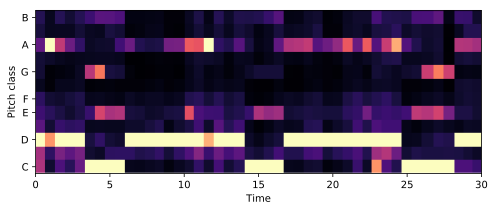

In [231]:
c_sync, beat_t = utilty.beat_synchronous_chroma_enhanced(audio)
lr.display.specshow(c_sync, x_axis='time', y_axis='chroma', x_coords=beat_t);

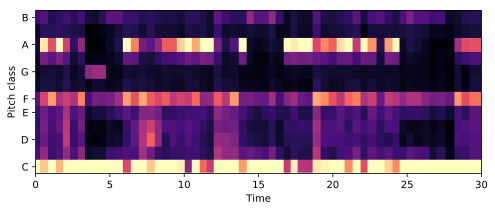

In [232]:
c_sync, beat_t = utilty.beat_synchronous_chroma_enhanced(audio_bg)
lr.display.specshow(c_sync, x_axis='time', y_axis='chroma', x_coords=beat_t);

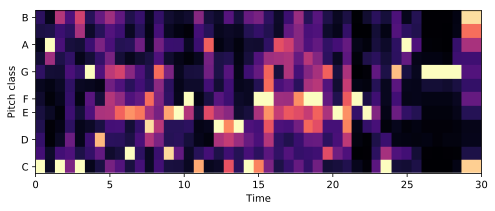

In [233]:
c_sync, beat_t = utilty.beat_synchronous_chroma_enhanced(audio_fg)
lr.display.specshow(c_sync, x_axis='time', y_axis='chroma', x_coords=beat_t);